# `spectrum` guide

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import colorcet as cc
import cmocean as cmo

# from popurri import spectrograph as spc
from popurri import spectrum as spectrum
from popurri import plotutils

# mpl.rcdefaults()
plotutils.mpl_custom_basic()
plotutils.mpl_size_same(font_size=18)

# Testing
%load_ext autoreload
%autoreload 2

In [2]:
dirout = './spectrum/'

## Single observation CARMENES VIS

In [3]:
filin = '/Users/marina/work/data/carmenes_gto/caracal/CARM_VIS/J07446+035/car-20160327T21h25m39s-sci-gtoc-vis_A.fits'
inst = 'carmvis'

# Read spectrum from filin
spec = spectrum.Spectrum(filin, inst, dirout=dirout)

# # Spectrum object variables
# vars(spec)

Plot the spectrum

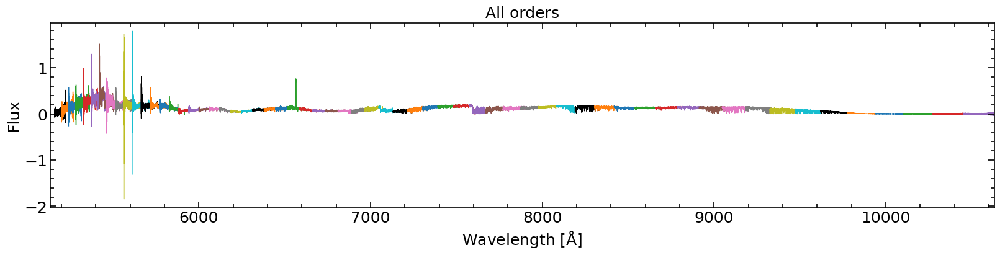

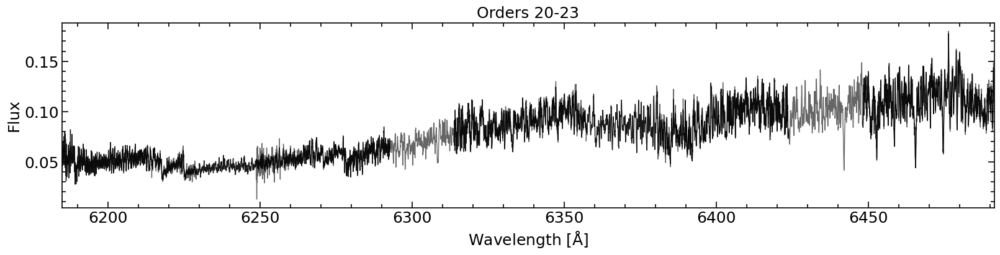

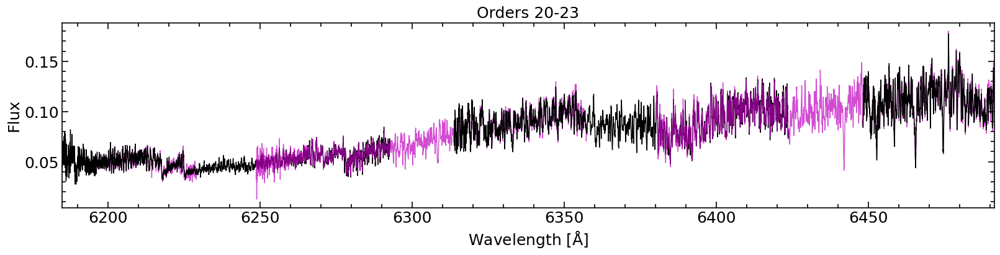

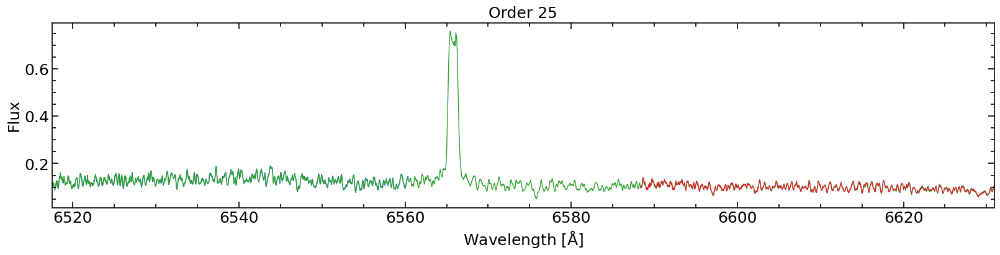

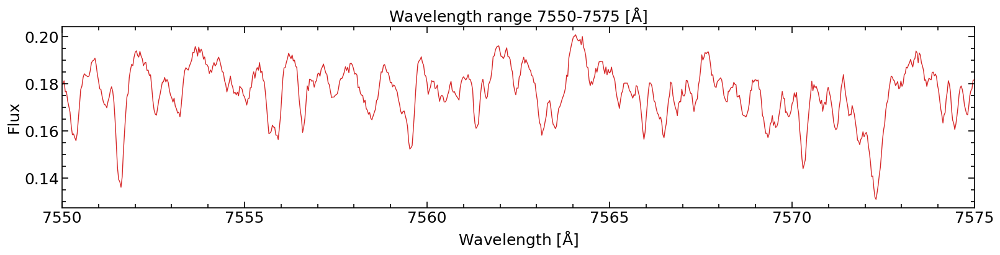

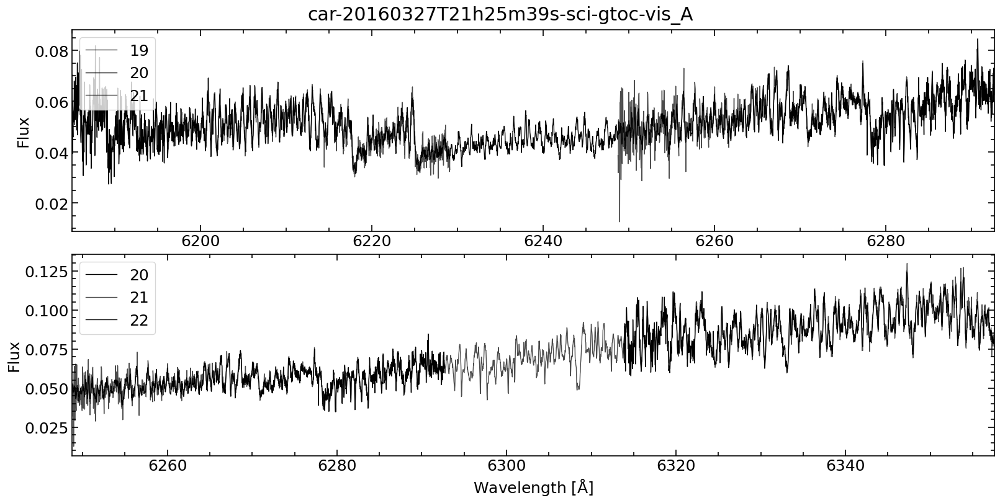

(None, None)

In [4]:
# Plot all orders
spec.fig_spectrum(title='All orders', sh=True, sv=False)

# Plot some of the central orders
spec.fig_spectrum(ords=spec.ords[20:24], title='Orders 20-23', color='k', alpha=0.9, alphaother=0.6, sh=True, sv=False)
spec.fig_spectrum(ords=spec.ords[20:24], title='Orders 20-23', color='k', colorother='m', sh=True, sv=False)

# Plot the order with Halpha
spec.fig_spectrum(ords=spec.ords[25], title='Order 25', sh=True, sv=False)

# Plot a specific wavelength range
spec.fig_spectrum(wmin=7550, wmax=7575, title='Wavelength range 7550-7575 $[\mathrm{\AA}]$', sh=True, sv=False)

# Plot 2 orders  on different panels
fig, ax = plt.subplots(2, 1, figsize=(16, 8), constrained_layout=True)
ax[0] = spec.plot_spectrum(ax=ax[0], ords=[20], color='k', legend=True, legendloc='upper left', xlabel='')
ax[1] = spec.plot_spectrum(ax=ax[1], ords=[21], color='k', legend=True, legendloc='upper left')
plt.suptitle(spec.filname)
plt.show(), plt.close()

Colormap, pixel

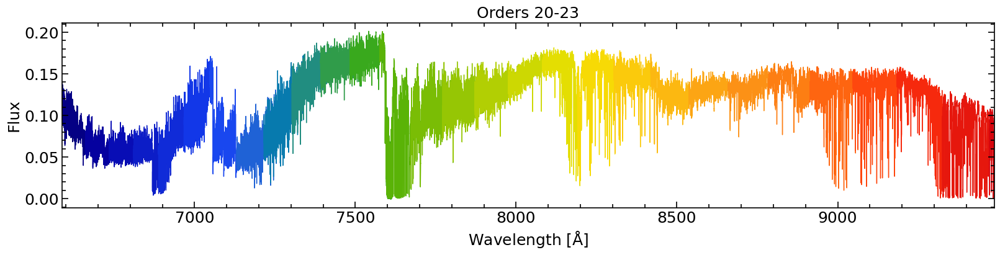

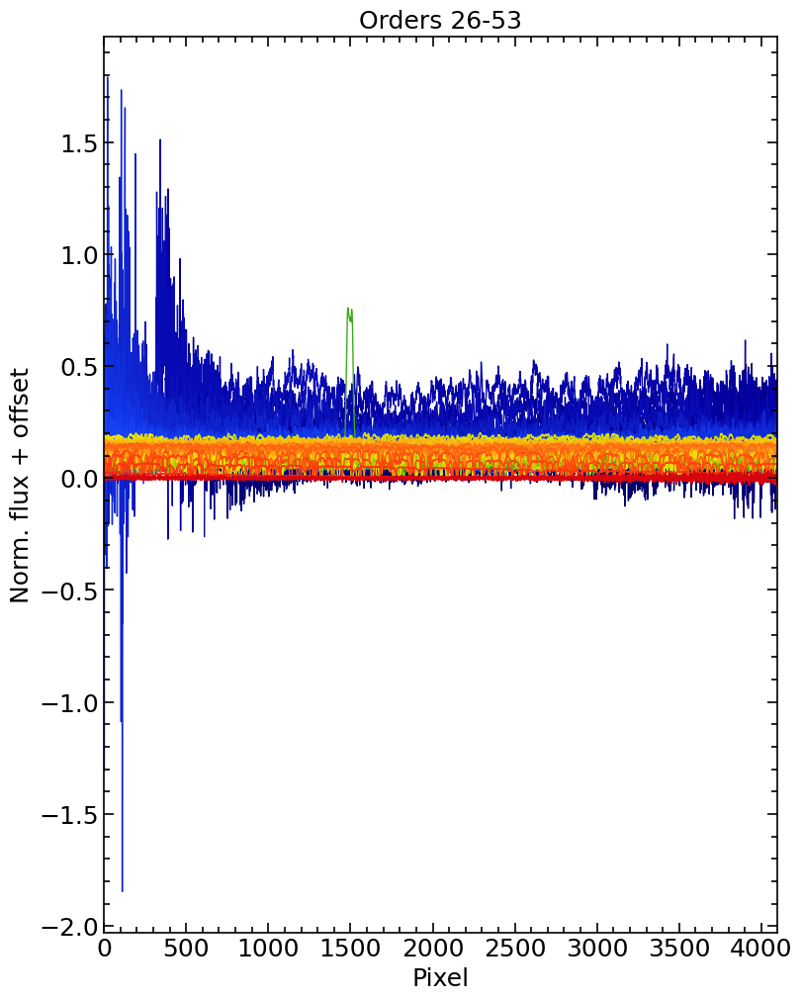

(61, 4096) (61, 4096)


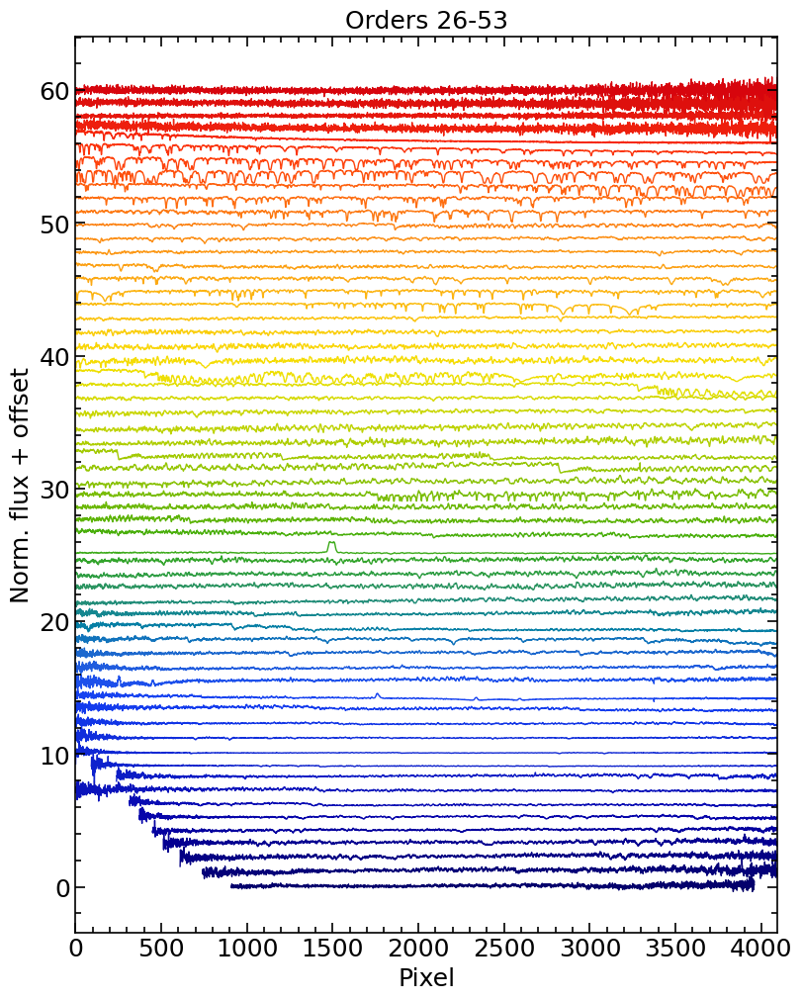

(61, 4096) (61, 4096)


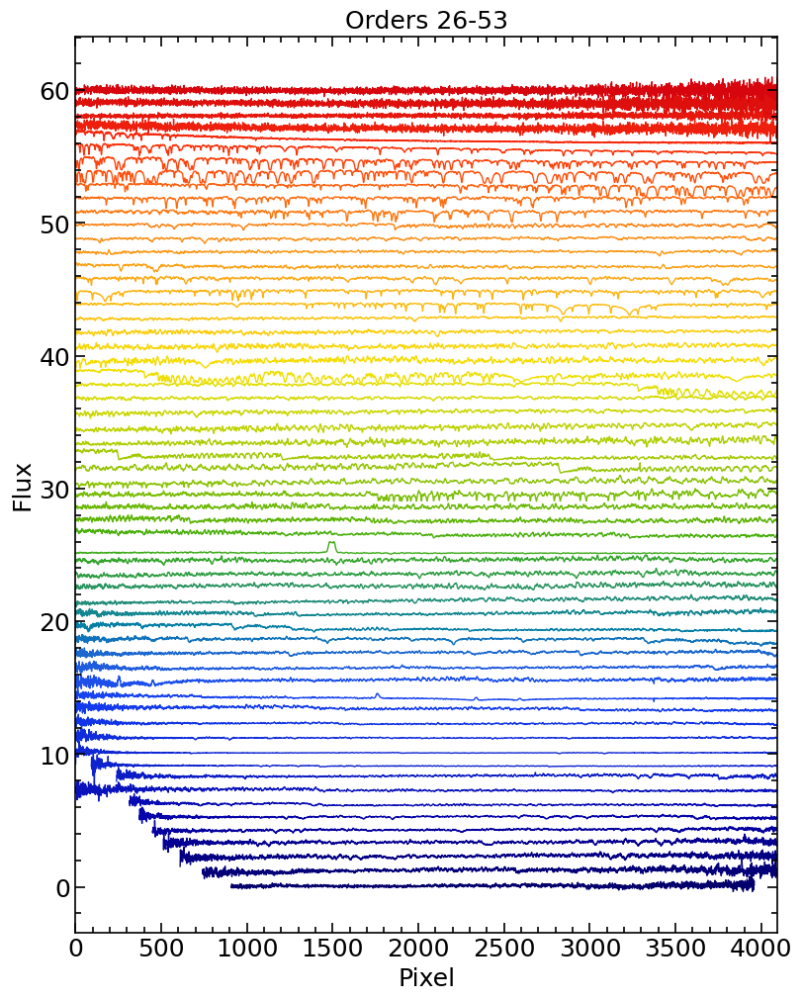

(61, 4096) (61, 4096)


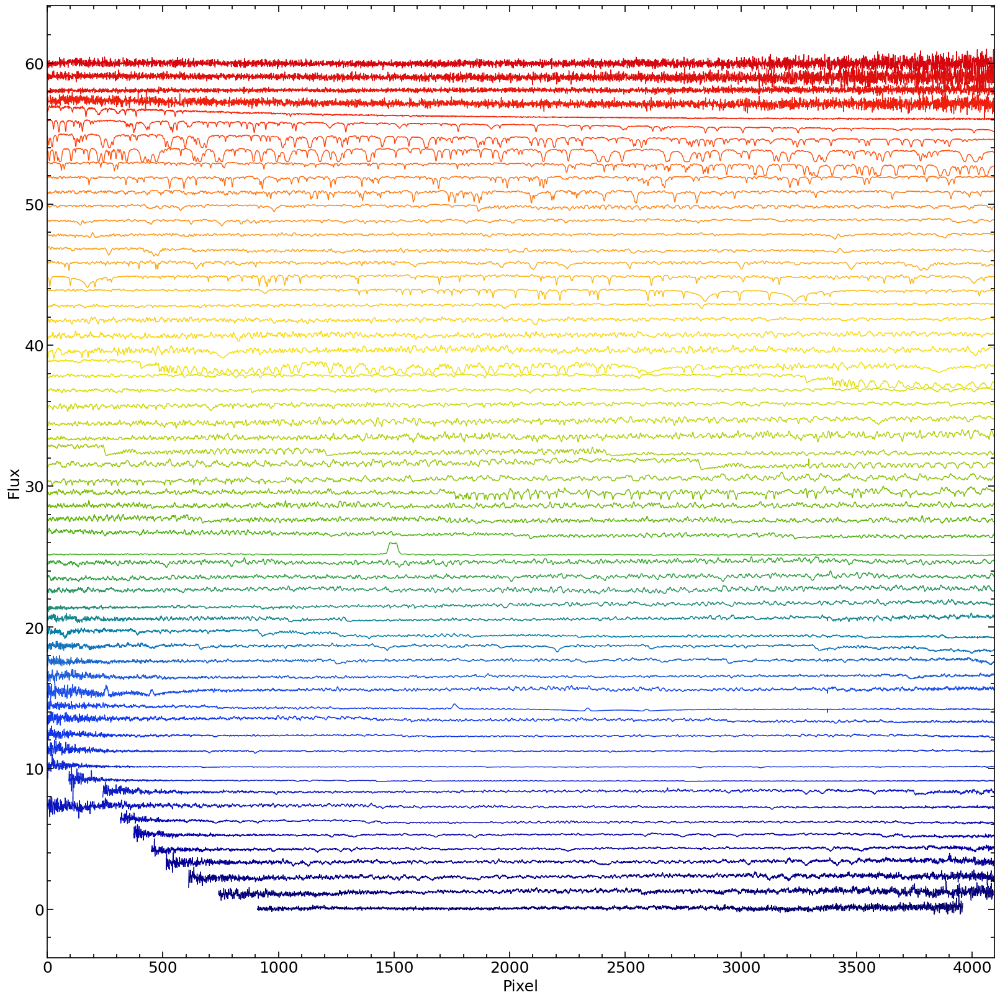

(61, 4096) (61, 4096)


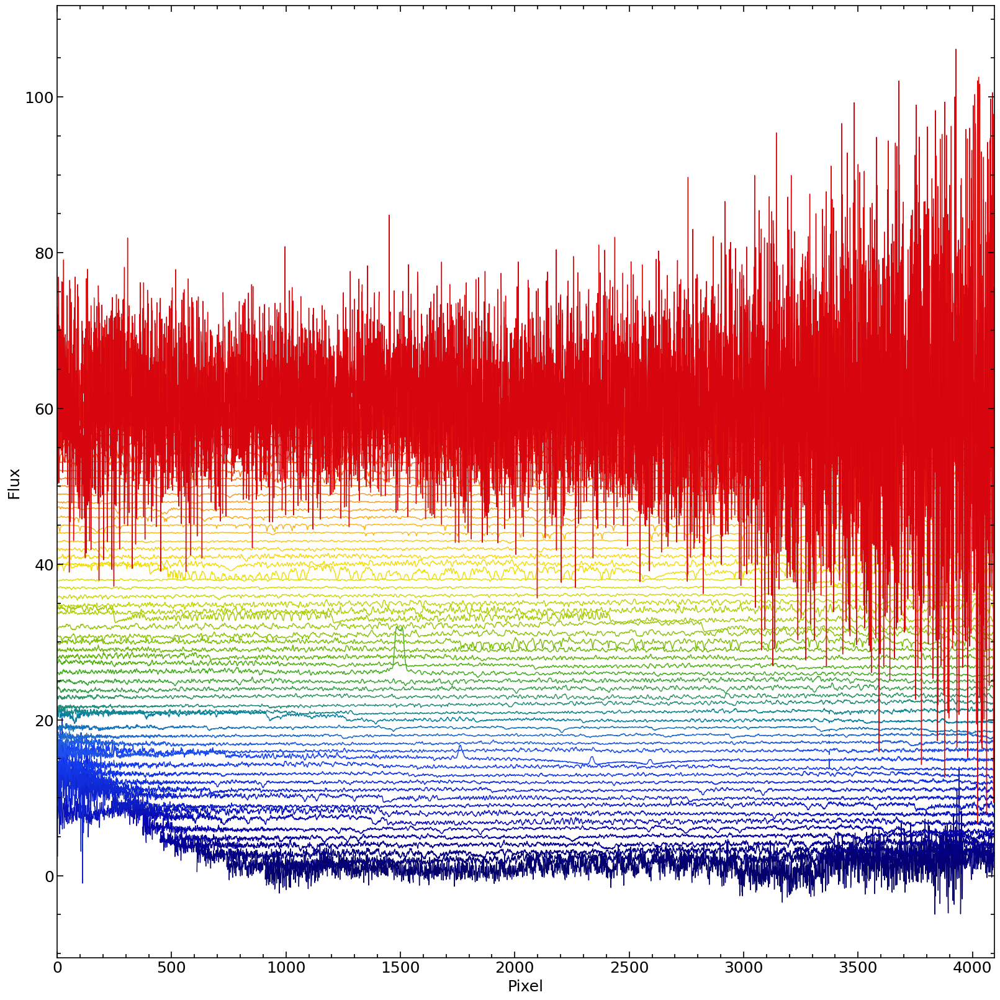

In [5]:
# Plot flux vs wavelength with orders colored following cmap
spec.fig_spectrum(ords=spec.ords[26:54], title='Orders 20-23', cmap=cc.cm.rainbow4, sh=True, sv=False)

# Plot pixel instead of wavelength -> Orders on top of each other
spec.fig_spectrum(figsize=(8, 10), x='pix', ords=spec.ords[26:54], title='Orders 26-53', xlabel='Pixel', ylabel='Norm. flux + offset', cmap=cc.cm.rainbow4, sh=True, sv=False)

# Plot pixel but normalise and shift (offset) the flux of each order
spec.fig_spectrum(figsize=(8, 10), x='pix', normflux=np.nanmax, offset=1, ords=spec.ords[26:54], title='Orders 26-53', xlabel='Pixel', ylabel='Norm. flux + offset', cmap=cc.cm.rainbow4, sh=True, sv=False)

# Same as above but with a function with parameters pre-defined to plot with pixel in the x-axis, flux normalised and shifted
spec.fig_spectrum_pix(figsize=(8, 10), ords=spec.ords[26:54], title='Orders 26-53', cmap=cc.cm.rainbow4, sh=True, sv=False)

# Plot all orders: Note orders do not look good if noisy pixels or strong emission lines
spec.fig_spectrum_pix(cmap=cc.cm.rainbow4, sh=True, sv=False)
spec.fig_spectrum_pix(normflux=np.nanmedian, cmap=cc.cm.rainbow4, sh=True, sv=False)

Plot order data

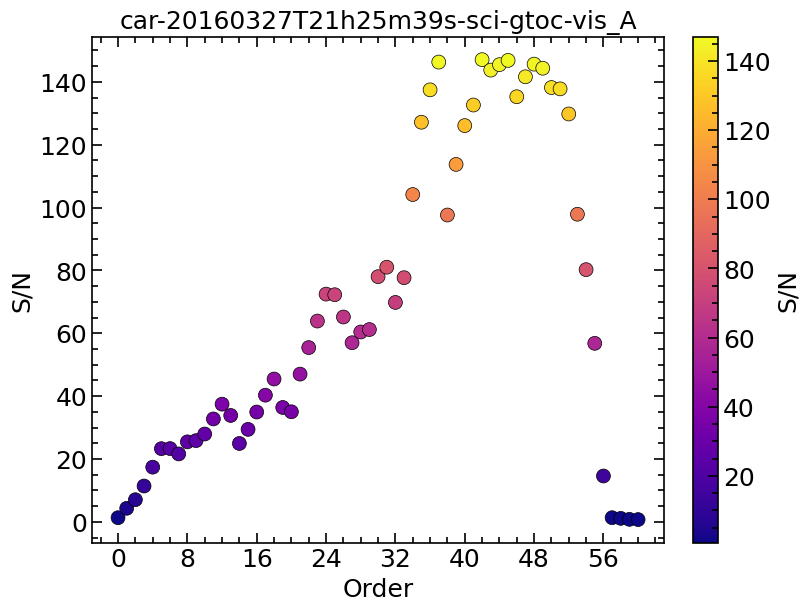

In [6]:
spec.fig_dataord('snr', z='snr', ylabel='S/N', zlabel='S/N', title=spec.filname, cmap='plasma', sh=True, sv=False)

## Single observation CARMENES NIR

Read a CARMENES NIR (`'carmnir'`) observation.
Note: Orders can be split into the two detectors (`ordcut`).

In [7]:
# Observation
inst = 'carmnir'
filin = '/Users/marina/work/data/carmenes_gto/caracal/CARM_NIR/J07446+035/car-20160924T05h04m12s-sci-gtoc-nir_A.fits'

# Read spectrum from filin
spec = spectrum.Spectrum(filin, inst, dirout=dirout, ordcut=True, saveordnoncut=True)
spec_nocut = spectrum.Spectrum(filin, inst, dirout=dirout, ordcut=False, saveordnoncut=False)

# # Spectrum object variables
# vars(spec)

Plot the spectrum.

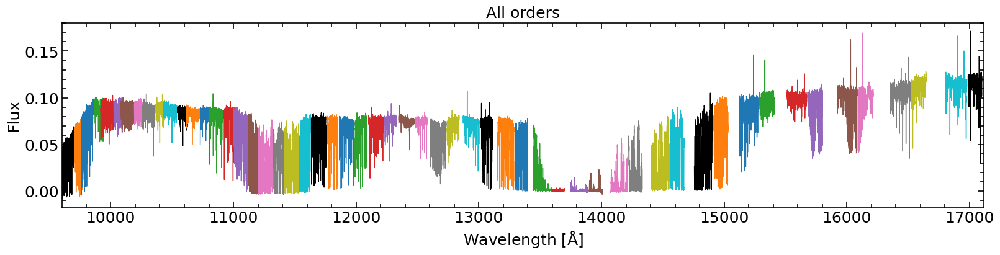

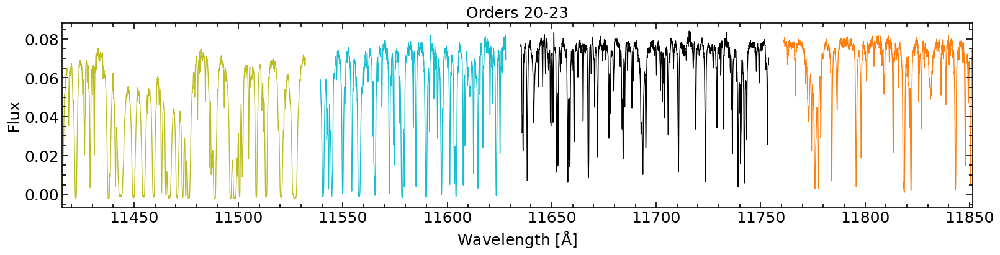

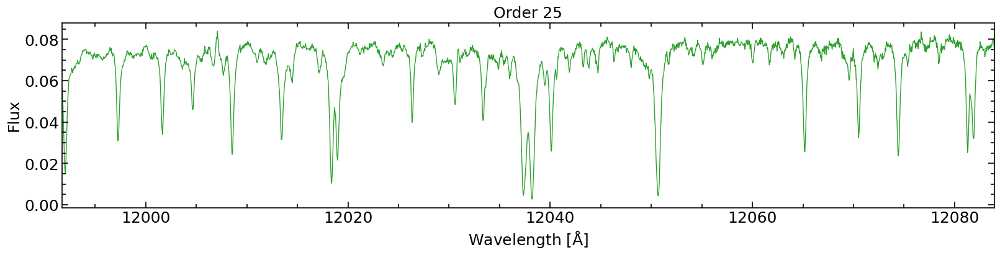

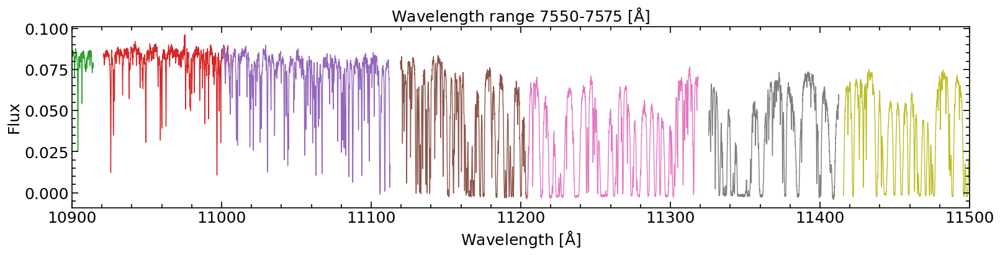

In [8]:
# Plot all orders
fig, ax = plt.subplots(1, 1, figsize=(16, 4), constrained_layout=True)
ax = spec.plot_spectrum(ax=ax, title='All orders')
plt.show()
plt.close()

# Plot some of the central orders
fig, ax = plt.subplots(1, 1, figsize=(16, 4), constrained_layout=True)
ax = spec.plot_spectrum(ax=ax, ords=spec.ords[20:24], title='Orders 20-23')
plt.show()
plt.close()

# Plot the order with Halpha
fig, ax = plt.subplots(1, 1, figsize=(16, 4), constrained_layout=True)
ax = spec.plot_spectrum(ax=ax, ords=spec.ords[25], title='Order 25')
plt.show()
plt.close()

# Plot a specific wavelength range
fig, ax = plt.subplots(1, 1, figsize=(16, 4), constrained_layout=True)
ax = spec.plot_spectrum(ax=ax, wmin=10900, wmax=11500, title='Wavelength range 7550-7575 $[\mathrm{\AA}]$')
plt.show()
plt.close()

Compare spectrum with orders cut and not cut.

Orders [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55] total number of orders 56


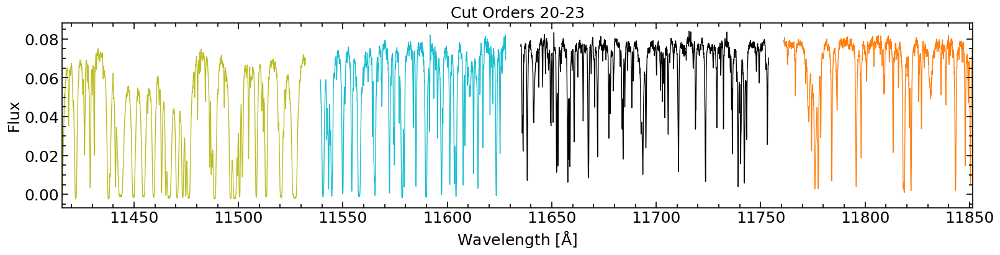

Orders [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27] total number of orders 28


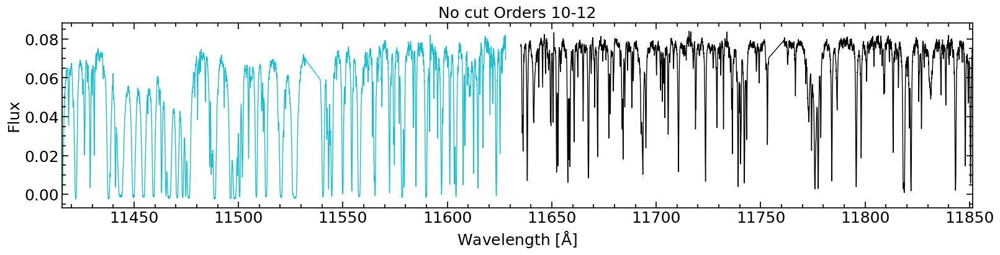

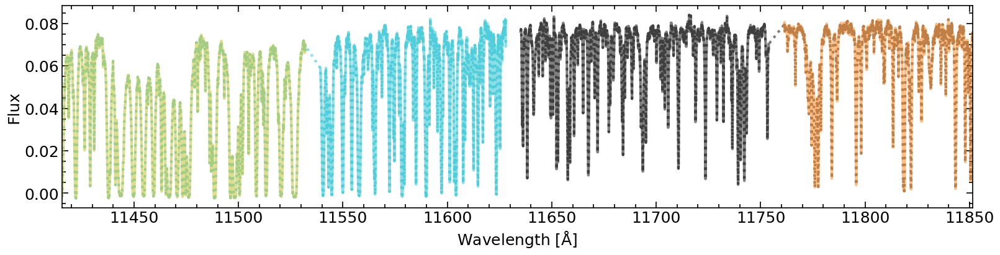

In [9]:
# Compare orders cut and nocut
print('Orders', spec.ords, 'total number of orders', len(spec.ords))
fig, ax = plt.subplots(1, 1, figsize=(16, 4), constrained_layout=True)
ax = spec.plot_spectrum(ax=ax, ords=spec.ords[20:24], title='Cut Orders 20-23')
plt.show()
plt.close()

print('Orders', spec_nocut.ords, 'total number of orders', len(spec_nocut.ords))
fig, ax = plt.subplots(1, 1, figsize=(16, 4), constrained_layout=True)
ax = spec_nocut.plot_spectrum(ax=ax, ords=spec.ords[10:12], title='No cut Orders 10-12')
plt.show()
plt.close()

fig, ax = plt.subplots(1, 1, figsize=(16, 4), constrained_layout=True)
ax = spec.plot_spectrum(ax=ax, ords=spec.ords[20:24], lw=3, alpha=0.5, zorder=2)
ax = spec_nocut.plot_spectrum(ax=ax, ords=spec.ords[10:12], lw=3, linestyle=':', alpha=0.5, zorder=1)
plt.show()
plt.close()

Plot order map, compare cut and no cut (no cut has less orders).

Note that for the cut case, if we use the real order indexing, the y-axis is not correct (because 2 different cut orders have the same real index).

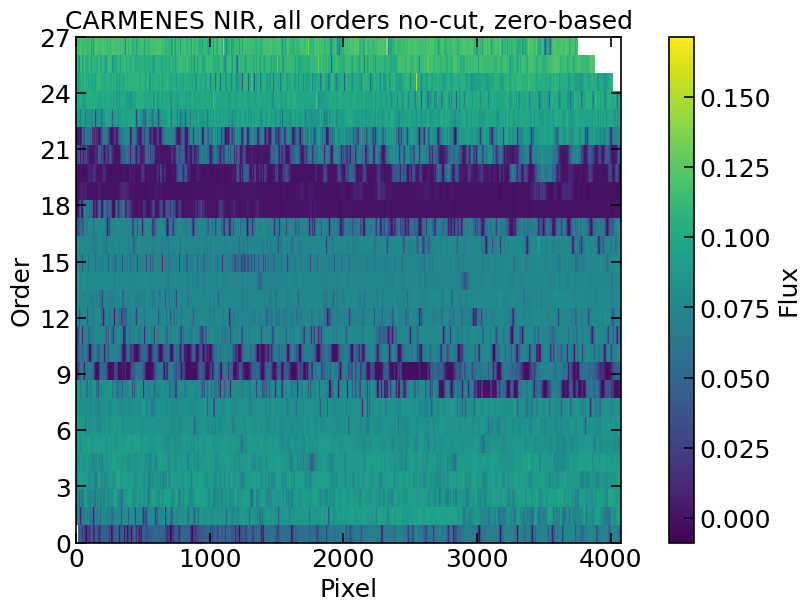

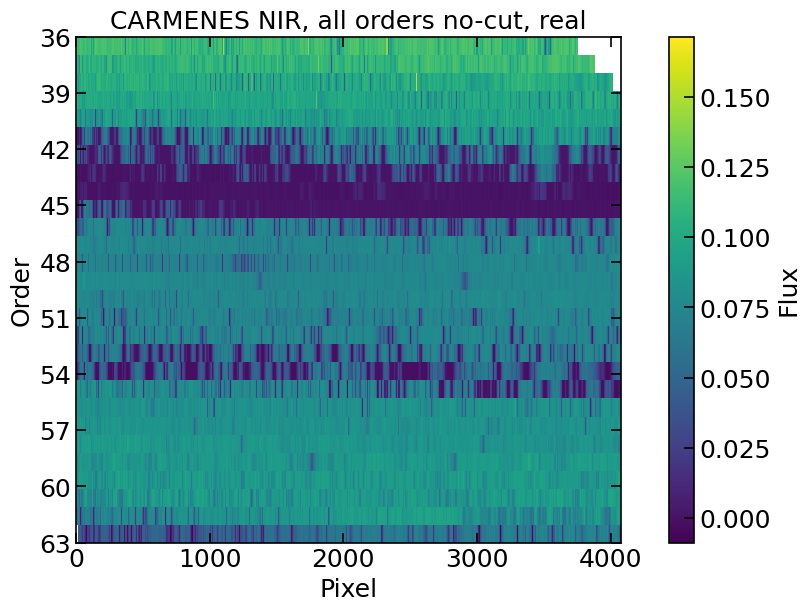

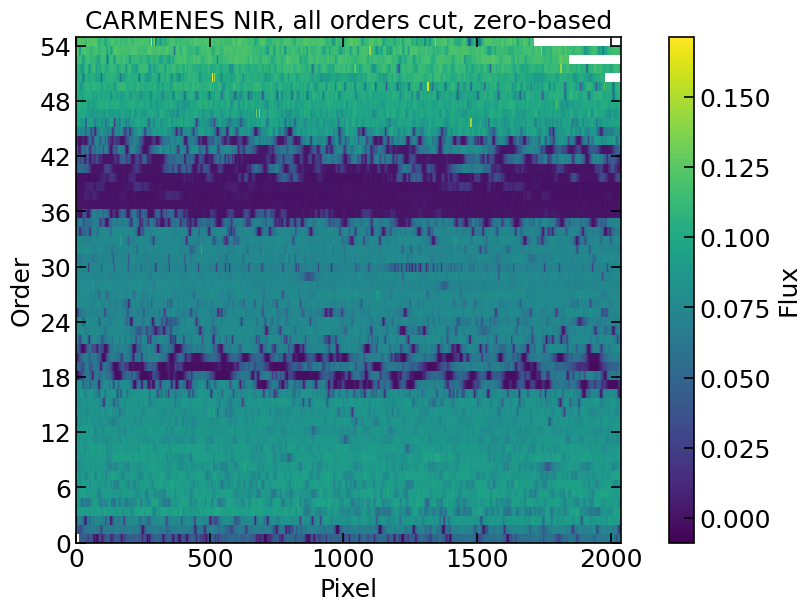

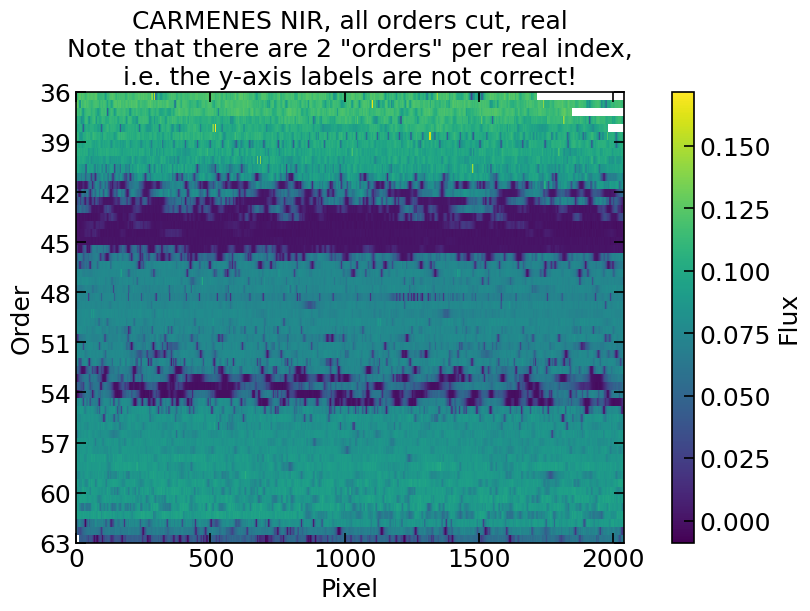

In [10]:
# Map of all orders flux
spec_nocut.fig_spectrum_map(title='CARMENES NIR, all orders no-cut, zero-based', sh=True, sv=False)

spec_nocut.fig_spectrum_map(ordtype='real', title='CARMENES NIR, all orders no-cut, real', sh=True, sv=False)

spec.fig_spectrum_map(title='CARMENES NIR, all orders cut, zero-based', sh=True, sv=False)

spec.fig_spectrum_map(ordtype='real', title='CARMENES NIR, all orders cut, real\nNote that there are 2 "orders" per real index,\ni.e. the y-axis labels are not correct!', sh=True, sv=False)

Plot orders map, cut in flux

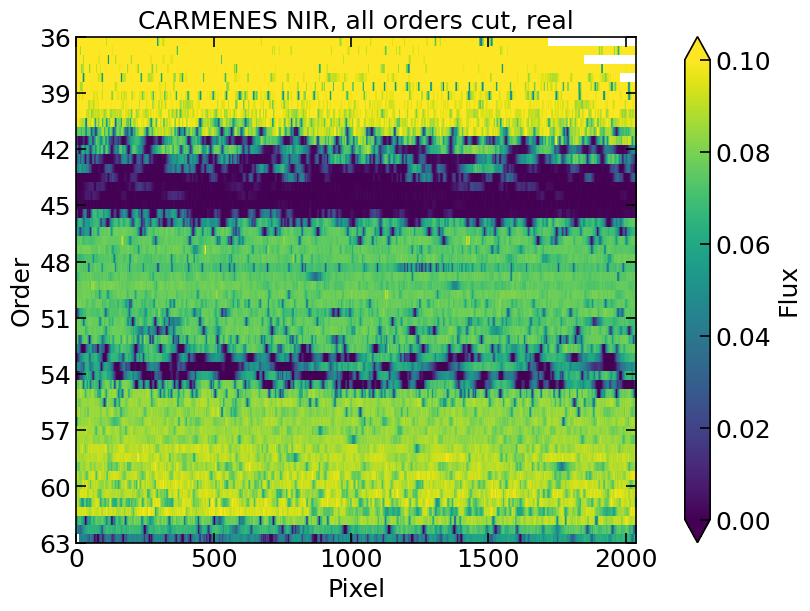

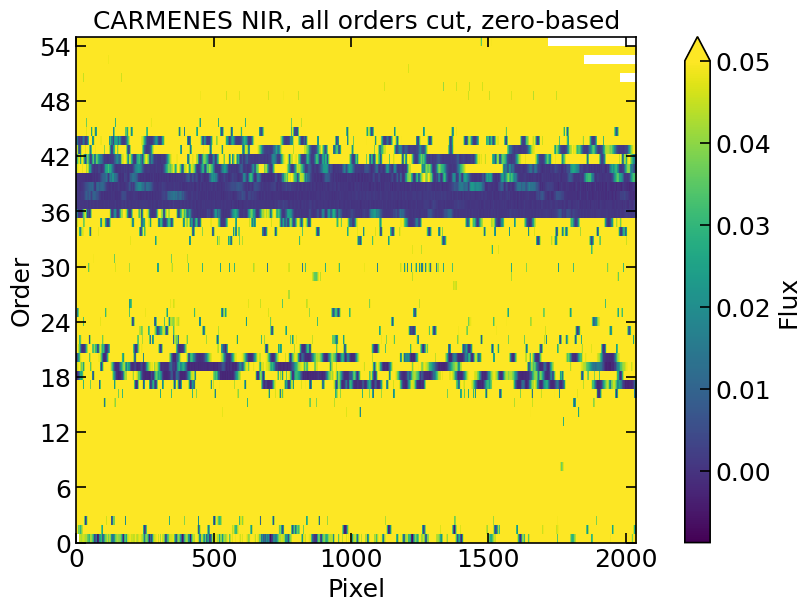

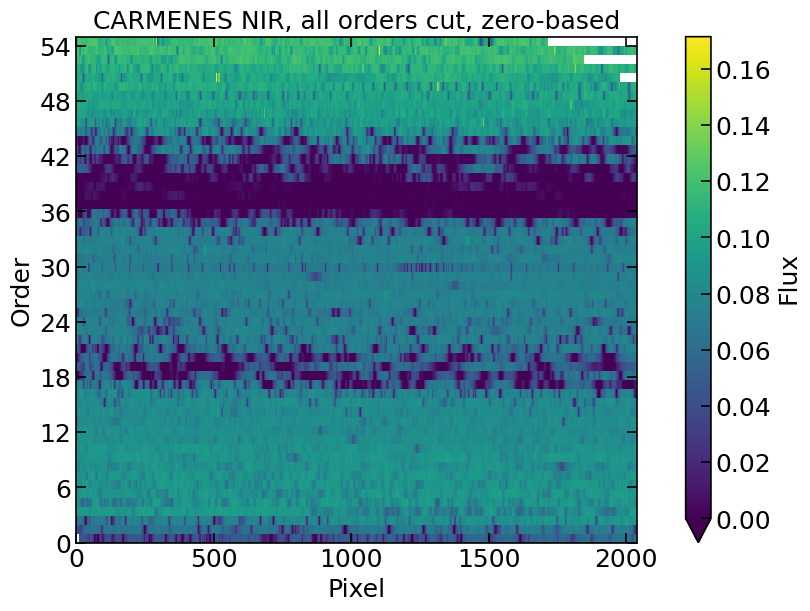

In [11]:
# Map of all orders flux, real orders, and cut in flux
spec.fig_spectrum_map(ordtype='real', vmin=0, vmax=0.1, title='CARMENES NIR, all orders cut, real', sh=True, sv=False)

spec.fig_spectrum_map(ordtype='zero', vmax=0.05, title='CARMENES NIR, all orders cut, zero-based', sh=True, sv=False)

spec.fig_spectrum_map(ordtype='zero', vmin=0, title='CARMENES NIR, all orders cut, zero-based', sh=True, sv=False)

Plot orders map, cut orders.

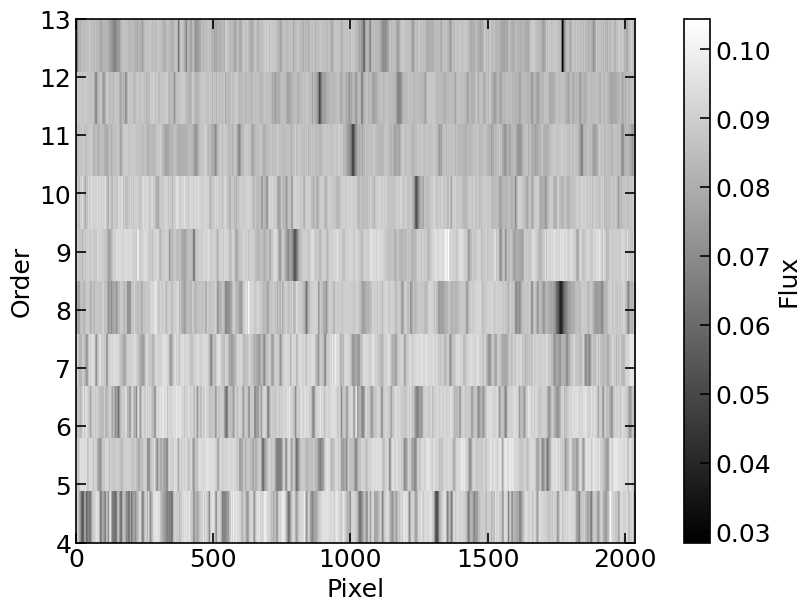

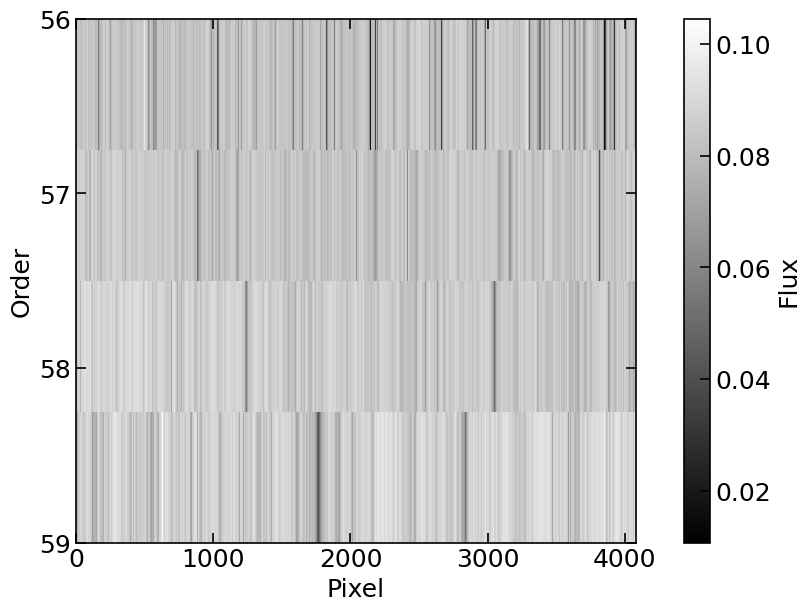

In [12]:
# Map of some orders
spec.fig_spectrum_map(ords=np.arange(4, 14, 1), ordtype='zero', cmap='gray', sh=True, sv=False)
spec_nocut.fig_spectrum_map(ords=np.arange(4, 8, 1), ordtype='real', cmap='gray', sh=True, sv=False)

Plot orders map, cut orders and  pixels

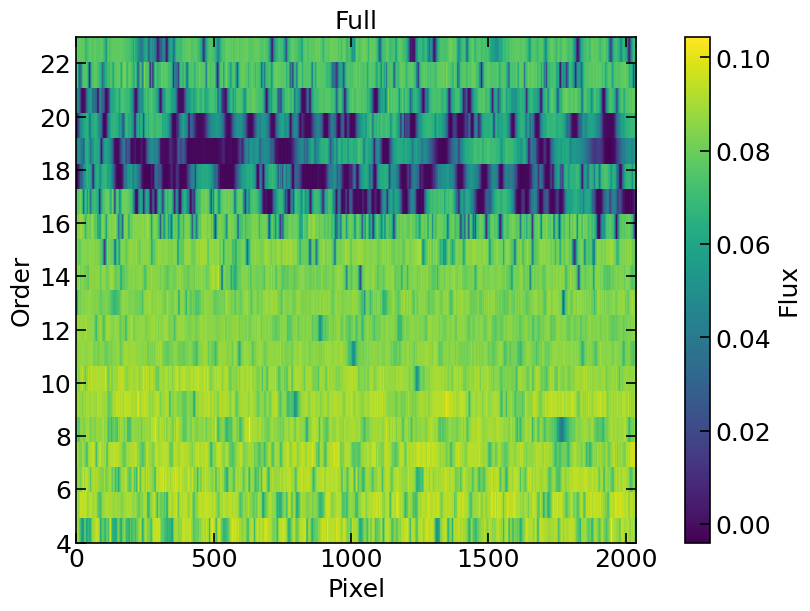

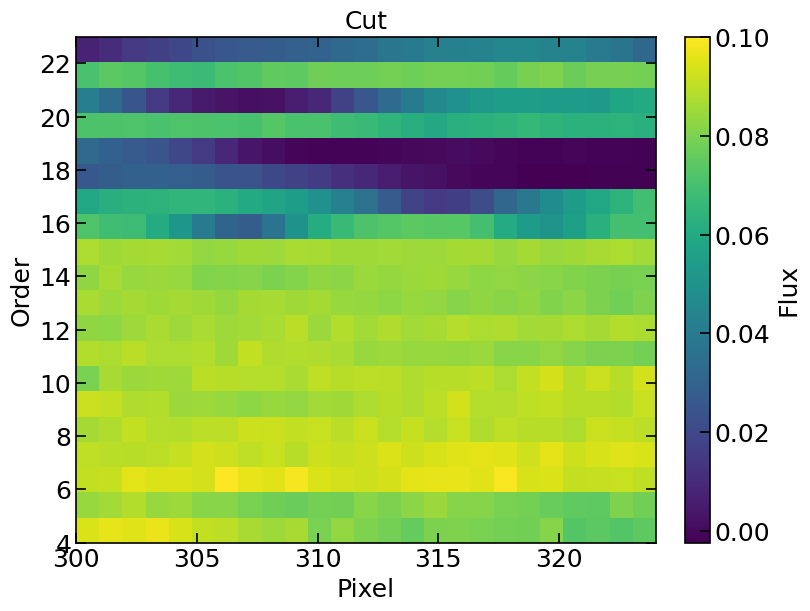

In [13]:
# Map of some pixels
spec.fig_spectrum_map(ords=np.arange(4, 24, 1), ordtype='zero', title='Full', sh=True, sv=False)
spec.fig_spectrum_map(ords=np.arange(4, 24, 1), pixs=np.arange(300, 325, 1), ordtype='zero', title='Cut', sh=True, sv=False)

## List of observation CARMENES VIS

In [14]:
lisfil = [
    '/Users/marina/work/data/carmenes_gto/caracal/CARM_VIS/J07446+035/car-20160318T22h26m50s-sci-gtoc-vis_A.fits',
    '/Users/marina/work/data/carmenes_gto/caracal/CARM_VIS/J07446+035/car-20160327T21h25m39s-sci-gtoc-vis_A.fits',
    '/Users/marina/work/data/carmenes_gto/caracal/CARM_VIS/J07446+035/car-20160411T20h12m48s-sci-gtoc-vis_A.fits',
    '/Users/marina/work/data/carmenes_gto/caracal/CARM_VIS/J07446+035/car-20170109T02h38m37s-sci-gtoc-vis_A.fits',
    '/Users/marina/work/data/carmenes_gto/caracal/CARM_VIS/J07446+035/car-20170302T20h25m06s-sci-gtoc-vis_A.fits',
    '/Users/marina/work/data/carmenes_gto/caracal/CARM_VIS/J07446+035/car-20170412T20h02m25s-sci-gtoc-vis_A.fits',
    '/Users/marina/work/data/carmenes_gto/caracal/CARM_VIS/J07446+035/car-20171230T01h42m48s-sci-gtoc-vis_A.fits',
    '/Users/marina/work/data/carmenes_gto/caracal/CARM_VIS/J07446+035/car-20180102T01h14m44s-sci-gtoc-vis_A.fits',
]
inst = 'carmvis'

# Read spectrum from filin
lisspec = spectrum.Spectra(lisfil, inst, dirout=dirout)

# vars(lisspec)

Plot spectrum of all observations

/Users/marina/anaconda3/envs/popurri/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


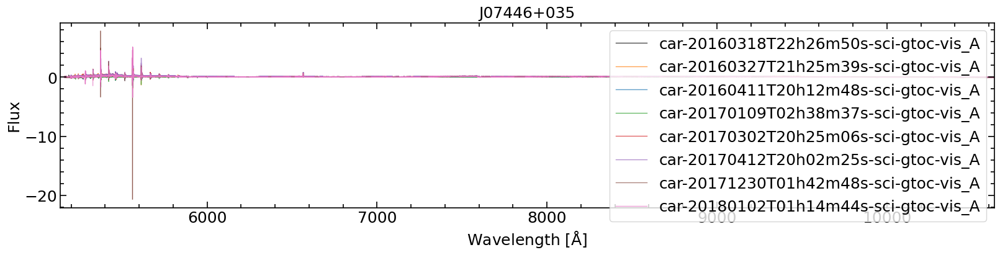

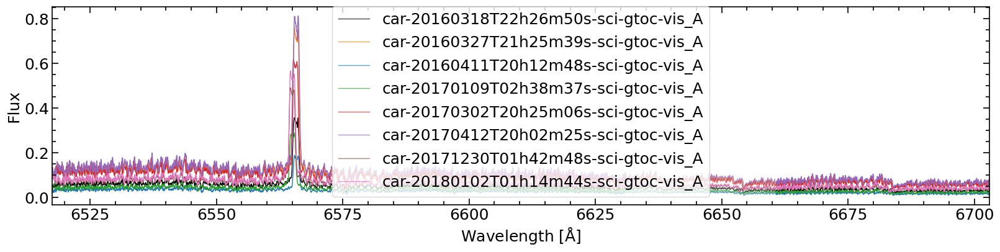

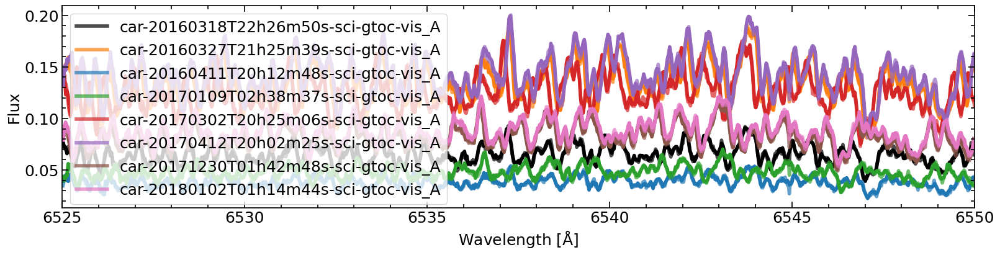

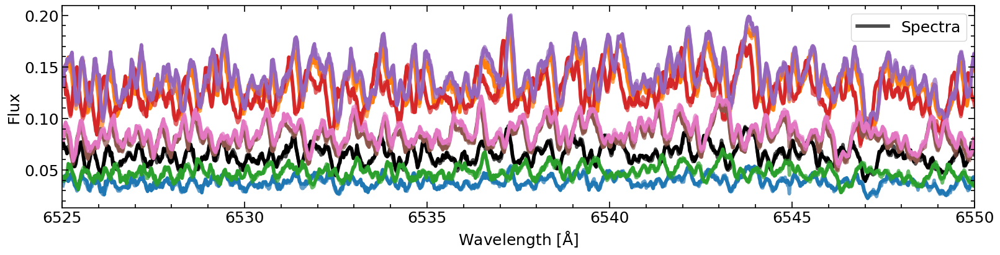

In [15]:
# All orders
lisspec.fig_spectra(legendwhich='all', legendlabel='obs', sh=True, sv=False, title=lisspec.obj)

# Specific orders `ords`
lisspec.fig_spectra(ords=[25, 26], legendwhich='all', legendlabel='obs', sh=True, sv=False)

# Specific wavelength range `wmin` and `wmax` (must be within the range of the orders in `ords`, if not nothing will be plotted)
lisspec.fig_spectra(ords=[25, 26], wmin=6525, wmax=6550, legendwhich='all', legendlabel='obs', sh=True, sv=False, lw=4)

# Without specifing the orders
lisspec.fig_spectra(wmin=6525, wmax=6550, legendwhich='first', legendlabel='Spectra', sh=True, sv=False, lw=4)

/Users/marina/work/code/popurri/popurri/spectrum.py:1080: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  norm = mpl.colors.Normalize(vmin=np.nanmin(cprop[lisspec]), vmax=np.nanmax(cprop[lisspec]))
/Users/marina/work/code/popurri/popurri/spectrum.py:1092: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  c = cmap(norm(cprop[idx]))


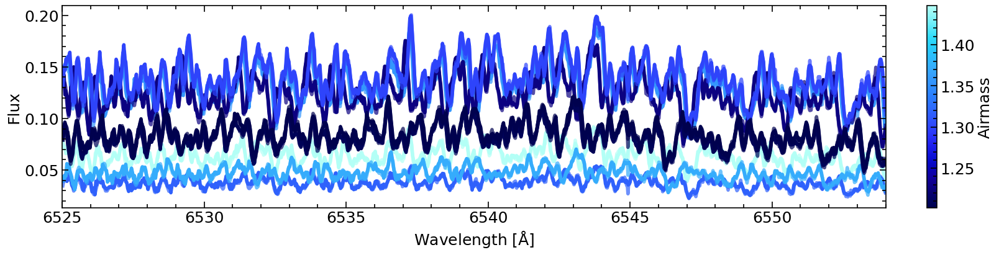

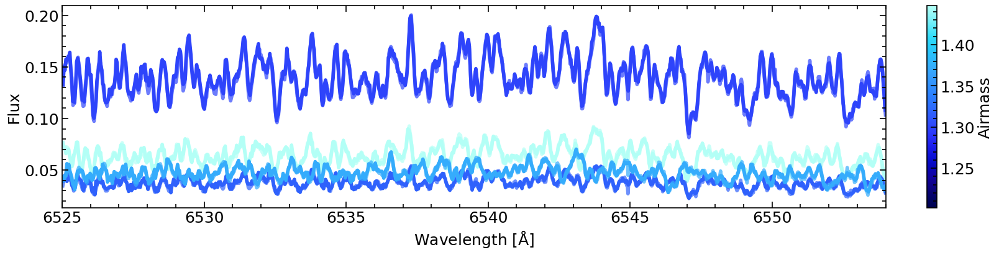

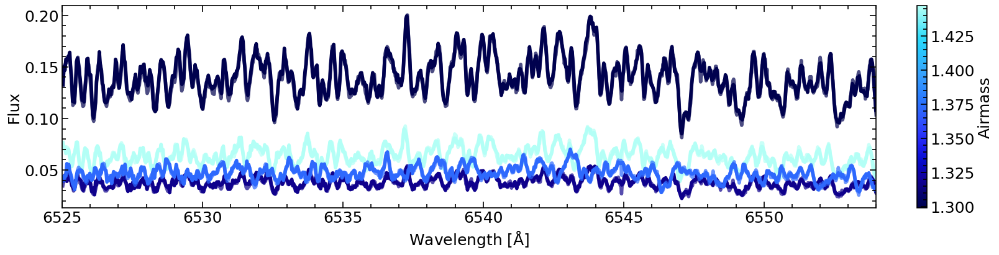

In [16]:
# Plot all observations with colormap of airmass
lisspec.fig_spectra(ords=[25, 26], wmin=6525, wmax=6554, sh=True, sv=False, cmap=cc.cm.kbc, lw=4, cprop=lisspec.dataheader['airmass'], cbarlabel='Airmass')

# Subset of observations, keep colormap of all observations
lisspec.fig_spectra(ords=[25, 26], wmin=6525, wmax=6554, sh=True, sv=False, cmap=cc.cm.kbc, lw=4, cprop=lisspec.dataheader['airmass'], cbarlabel='Airmass', lisspec=[0, 2, 3, 5], cprop_all=True)

# Subset of observations, update colormap to only the subset
lisspec.fig_spectra(ords=[25, 26], wmin=6525, wmax=6554, sh=True, sv=False, cmap=cc.cm.kbc, lw=4, cprop=lisspec.dataheader['airmass'], cbarlabel='Airmass', lisspec=[0, 2, 3, 5])

### Plot per order property of all observations

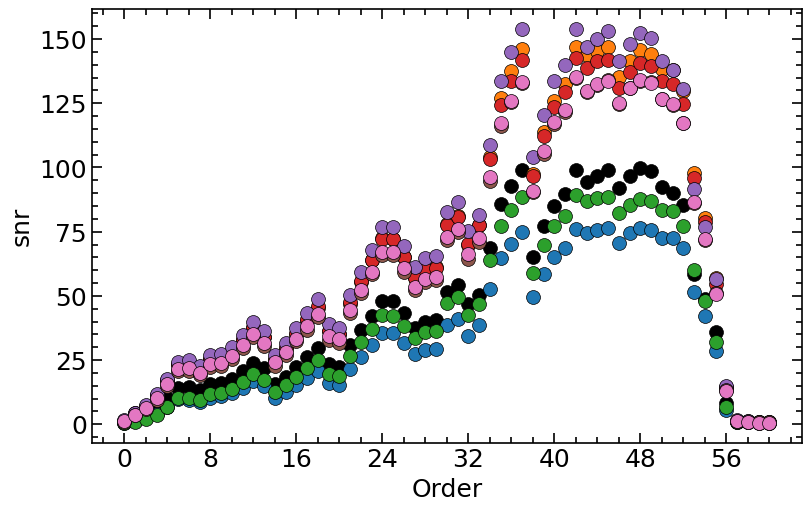

/Users/marina/work/code/popurri/popurri/spectrum.py:1190: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  sc = ax.scatter(ords, datay.iloc[i], c=c, zorder=zorder, s=s, edgecolors=edgecolors, linewidths=linewidths, **kwargs)


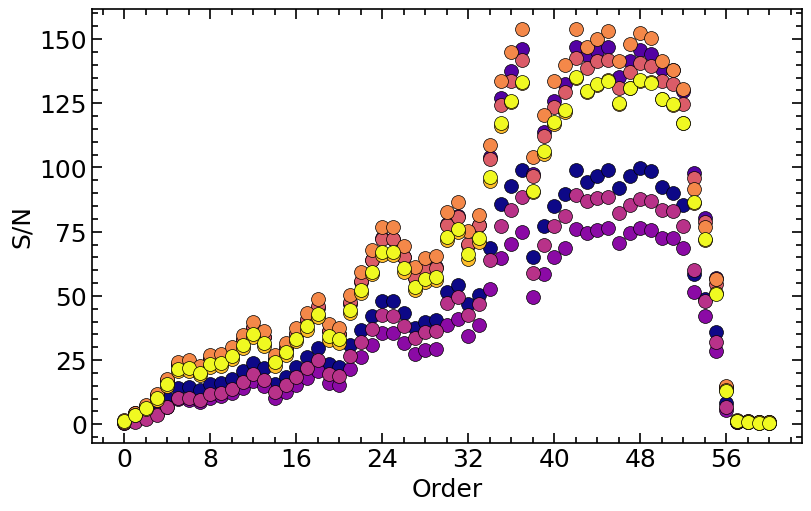

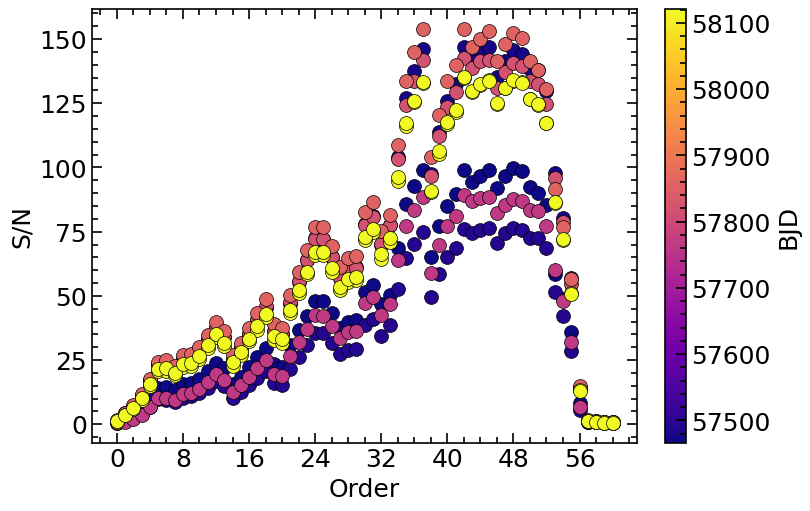

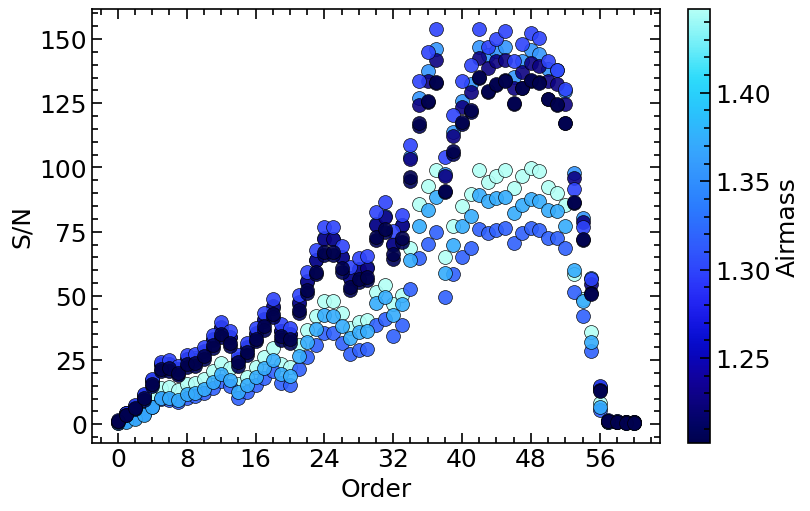

In [17]:
# Plot S/N per order, for all observations
lisspec.fig_dataord('snr', sh=True, sv=False)

# Color from colormap (following observation index)
lisspec.fig_dataord('snr', ylabel='S/N', cmap='plasma', sh=True, sv=False)

# Color from colormap following property bjd in `dataheader` (should be the similar colors as above if observations are ordered in time, difference due to difference in spacing between index and BJD)
lisspec.fig_dataord('snr', ylabel='S/N', z='bjd', zlabel='BJD', cmap='plasma', sh=True, sv=False)

# Color from colormap following property airmass in `dataheader`
lisspec.fig_dataord('snr', ylabel='S/N', z='airmass', zlabel='Airmass', cmap=cc.cm.kbc, alpha=0.9, sh=True, sv=False)


## S/N

In [18]:
lisfil = [
    '/Users/marina/work/data/carmenes_gto/caracal/CARM_VIS/J07446+035/car-20160318T22h26m50s-sci-gtoc-vis_A.fits',
    '/Users/marina/work/data/carmenes_gto/caracal/CARM_VIS/J07446+035/car-20160327T21h25m39s-sci-gtoc-vis_A.fits',
    '/Users/marina/work/data/carmenes_gto/caracal/CARM_VIS/J07446+035/car-20160411T20h12m48s-sci-gtoc-vis_A.fits',
    '/Users/marina/work/data/carmenes_gto/caracal/CARM_VIS/J07446+035/car-20170109T02h38m37s-sci-gtoc-vis_A.fits',
    '/Users/marina/work/data/carmenes_gto/caracal/CARM_VIS/J07446+035/car-20170302T20h25m06s-sci-gtoc-vis_A.fits',
    '/Users/marina/work/data/carmenes_gto/caracal/CARM_VIS/J07446+035/car-20170412T20h02m25s-sci-gtoc-vis_A.fits',
    '/Users/marina/work/data/carmenes_gto/caracal/CARM_VIS/J07446+035/car-20171230T01h42m48s-sci-gtoc-vis_A.fits',
    '/Users/marina/work/data/carmenes_gto/caracal/CARM_VIS/J07446+035/car-20180102T01h14m44s-sci-gtoc-vis_A.fits',
]
inst = 'carmvis'

# Read spectrum from filin
lisspec = spectrum.Spectra(lisfil, inst, dirout=dirout)

# vars(lisspec)

In [19]:
lisspec.dataheader

,airhum,airmass,airmass_end,airmass_start,berv,berv_max,bjd,date_start,dec_deg,drift,...,snro51,snro52,snro53,snro54,snro55,snro56,snro57,snro58,snro59,snro60
car-20160318T22h26m50s-sci-gtoc-vis_A,NaN,1.4472,NaN,NaN,-24.960843,NaN,57466.441682,2016-03-18T22:26:50,3.550333,5.280760,...,89.960,85.466,58.368,48.723,36.025,8.4427,0.88638,0.76074,0.68711,0.63991
car-20160327T21h25m39s-sci-gtoc-vis_A,NaN,1.3556,NaN,NaN,-26.745976,NaN,57475.400098,2016-03-27T21:25:39,3.550333,8.804540,...,137.750,129.760,97.864,80.232,56.793,14.5830,1.31660,1.11120,0.79862,0.71682
car-20160411T20h12m48s-sci-gtoc-vis_A,NaN,1.3172,NaN,NaN,-28.345505,NaN,57490.349229,2016-04-11T20:12:48,3.550333,2.437240,...,72.699,68.544,51.685,42.036,28.376,5.6667,0.86901,0.79521,0.70693,0.62124
car-20170109T02h38m37s-sci-gtoc-vis_A,NaN,1.3719,NaN,NaN,4.224916,NaN,57762.616890,2017-01-09T02:38:37,3.550389,4.998870,...,83.165,77.302,59.964,48.169,31.995,6.6406,1.03250,0.71653,0.61393,0.66281
car-20170302T20h25m06s-sci-gtoc-vis_A,NaN,1.2270,NaN,NaN,-19.819234,NaN,57815.357620,2017-03-02T20:25:06,3.550389,-0.789388,...,132.670,124.770,95.966,78.689,54.534,14.2390,1.30630,1.06210,0.82434,0.75072
car-20170412T20h02m25s-sci-gtoc-vis_A,NaN,1.2993,NaN,NaN,-28.340839,NaN,57856.339926,2017-04-12T20:02:25,3.550389,-7.596280,...,138.030,130.470,91.573,76.745,56.420,14.8890,1.70510,1.34840,0.80956,0.71723
car-20171230T01h42m48s-sci-gtoc-vis_A,NaN,1.2070,NaN,NaN,9.407480,NaN,58117.580624,2017-12-30T01:42:48,3.550389,2.974620,...,124.200,117.330,86.239,71.868,51.068,13.2280,1.25430,0.99787,0.75848,0.72809
car-20180102T01h14m44s-sci-gtoc-vis_A,NaN,1.2022,NaN,NaN,8.004895,NaN,58120.561319,2018-01-02T01:14:44,3.550389,4.125970,...,124.850,117.390,86.493,72.102,50.707,13.0370,1.15830,1.00020,0.58225,0.55213


In [20]:
lisspec.dataord['snr']

,0,1,2,3,4,5,6,7,8,9,...,51,52,53,54,55,56,57,58,59,60
car-20160318T22h26m50s-sci-gtoc-vis_A,0.73764,2.1662,3.9004,6.2601,10.2700,14.1330,14.5690,13.2800,15.776,16.165,...,89.960,85.466,58.368,48.723,36.025,8.4427,0.88638,0.76074,0.68711,0.63991
car-20160327T21h25m39s-sci-gtoc-vis_A,1.31520,4.3115,7.0373,11.3970,17.3990,23.2760,23.3070,21.6080,25.449,25.834,...,137.750,129.760,97.864,80.232,56.793,14.5830,1.31660,1.11120,0.79862,0.71682
car-20160411T20h12m48s-sci-gtoc-vis_A,0.63032,1.2139,2.5354,4.0185,6.5503,9.6718,9.6223,8.6419,10.409,10.867,...,72.699,68.544,51.685,42.036,28.376,5.6667,0.86901,0.79521,0.70693,0.62124
car-20170109T02h38m37s-sci-gtoc-vis_A,0.58134,1.0072,2.0739,3.7211,6.5540,10.1870,10.3310,9.4551,11.851,12.118,...,83.165,77.302,59.964,48.169,31.995,6.6406,1.03250,0.71653,0.61393,0.66281
car-20170302T20h25m06s-sci-gtoc-vis_A,1.36440,4.2096,6.8966,11.0790,16.9610,23.4030,23.3600,21.5520,25.536,25.226,...,132.670,124.770,95.966,78.689,54.534,14.2390,1.30630,1.06210,0.82434,0.75072
car-20170412T20h02m25s-sci-gtoc-vis_A,1.54050,4.4375,7.6438,11.8830,17.7070,24.3340,24.9740,22.7590,26.802,27.506,...,138.030,130.470,91.573,76.745,56.420,14.8890,1.70510,1.34840,0.80956,0.71723
car-20171230T01h42m48s-sci-gtoc-vis_A,1.04680,3.4788,6.0343,9.6238,15.0920,20.7060,20.5970,19.0140,22.370,22.571,...,124.200,117.330,86.239,71.868,51.068,13.2280,1.25430,0.99787,0.75848,0.72809
car-20180102T01h14m44s-sci-gtoc-vis_A,1.27660,3.7896,6.4974,10.2110,15.7960,21.5130,21.8060,19.9950,23.623,23.680,...,124.850,117.390,86.493,72.102,50.707,13.0370,1.15830,1.00020,0.58225,0.55213


In [21]:
spec.header['*CARACAL FOX SNR*']

HIERARCH CARACAL FOX SNR 0 = 27.503 / SNR per pixel in order 63                 
HIERARCH CARACAL FOX SNR 1 = 44.568 / SNR per pixel in order 62                 
HIERARCH CARACAL FOX SNR 2 = 49.54 / SNR per pixel in order 61                  
HIERARCH CARACAL FOX SNR 3 = 53.839 / SNR per pixel in order 60                 
HIERARCH CARACAL FOX SNR 4 = 56.171 / SNR per pixel in order 59                 
HIERARCH CARACAL FOX SNR 5 = 60.053 / SNR per pixel in order 58                 
HIERARCH CARACAL FOX SNR 6 = 61.869 / SNR per pixel in order 57                 
HIERARCH CARACAL FOX SNR 7 = 64.983 / SNR per pixel in order 56                 
HIERARCH CARACAL FOX SNR 8 = 63.016 / SNR per pixel in order 55                 
HIERARCH CARACAL FOX SNR 9 = 42.813 / SNR per pixel in order 54                 
HIERARCH CARACAL FOX SNR 10 = 50.537 / SNR per pixel in order 53                
HIERARCH CARACAL FOX SNR 11 = 69.799 / SNR per pixel in order 52                
HIERARCH CARACAL FOX SNR 12 

## Doppler shift

In [36]:
# single obs
filin = '/Users/marina/work/data/carmenes_gto/caracal/CARM_VIS/J07446+035/car-20160327T21h25m39s-sci-gtoc-vis_A.fits'
inst = 'carmvis'

# Read spectrum from filin
spec = spectrum.Spectrum(filin, inst, dirout=dirout)

# Doppler shift by BERV
spec.dopplershift(spec.dataheader['berv'])

In [30]:
# Multiple obs
lisfil = [
    '/Users/marina/work/data/carmenes_gto/caracal/CARM_VIS/J07446+035/car-20160318T22h26m50s-sci-gtoc-vis_A.fits',
    '/Users/marina/work/data/carmenes_gto/caracal/CARM_VIS/J07446+035/car-20160327T21h25m39s-sci-gtoc-vis_A.fits',
    '/Users/marina/work/data/carmenes_gto/caracal/CARM_VIS/J07446+035/car-20160411T20h12m48s-sci-gtoc-vis_A.fits',
    '/Users/marina/work/data/carmenes_gto/caracal/CARM_VIS/J07446+035/car-20170109T02h38m37s-sci-gtoc-vis_A.fits',
    '/Users/marina/work/data/carmenes_gto/caracal/CARM_VIS/J07446+035/car-20170302T20h25m06s-sci-gtoc-vis_A.fits',
    '/Users/marina/work/data/carmenes_gto/caracal/CARM_VIS/J07446+035/car-20170412T20h02m25s-sci-gtoc-vis_A.fits',
    '/Users/marina/work/data/carmenes_gto/caracal/CARM_VIS/J07446+035/car-20171230T01h42m48s-sci-gtoc-vis_A.fits',
    '/Users/marina/work/data/carmenes_gto/caracal/CARM_VIS/J07446+035/car-20180102T01h14m44s-sci-gtoc-vis_A.fits',
]
inst = 'carmvis'

# Read spectrum from filin
lisspec = spectrum.Spectra(lisfil, inst, dirout=dirout)

# Doppler shift by BERV
lisv = lisspec.dataheader['berv']
lisspec.dopplershift(lisv)